# 1.0 Using Machine Learning to Determine Predictability of NHL Stanley Cup Winners Based on Regular Season Data
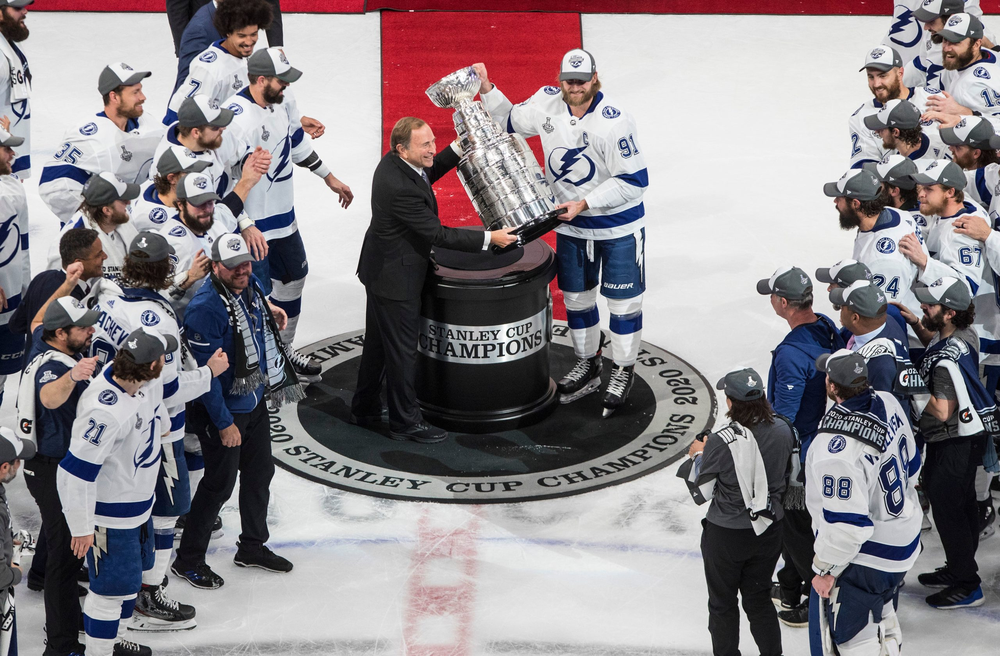


## 1.1 Background And Motivation
The National Hockey League crowns its winner every year by awarding the Stanley Cup to the champion of the league playoffs. In a 31 team league (30 teams prior to the 2017-2018 season), 16 teams make the playoffs, where a team must win four best-of-seven series' to become the champion. In past years, these winners have seemed to show little to no correlation to regular season performance, and guessing a winner is often attributed to luck. Despite this believe, there is reason to believe that this is not the case, and a deeper look into statistics is just required to determine a winner. 

If successful, this model can be applied to gambling, where bets can be made corresponding to the results of the model, in hopes of accurately predicting a winner to gain a profit.

## 1.2 Purpose
The purpose of this project is to determine whether a team's regular season statistics are indicative of how they will perform in the playoffs. 

## 1.3 Methodology
The data was collected from http://www.nhl.com/stats/teamsaggregate=0&reportType=season&seasonFrom=20102011&seasonTo=20192020&gameType=2&filter=gamesPlayed,gte,1&sort=points,wins&page=0&pageSize=50 and https://stathead.com/hockey/tpbp_finder.cgi#stats::none, with the former being regular season and playoff data for individual teams, and the latter being advanced regular season analytics. The data was collected from the past 10 NHL seasons, excluding the 2019-2020 NHL season (which was shortened due to COVID). 

With the use of machine learning and PCAs, there is hope create a model that can predict a team's performance with accuracy based on their regular season statistics. To do this, thirty-seven regular season statistics were used. The number of components used in the model was determined by a for loop that tested the accuracy of 37 models which each had a different number of components (from 1 to 37). The best combination of components for each model was determined using a PCA. The accuracy of each of the models was then measured, and the best model (and thus the ideal number of components) was determined.\

Next, three paramaters were tested using GridSearchCV to determine the best paramater of the given inputs. The three parameters tested were the gamma value, the C value, and the kernel type (linear or rbf). Once the ideal values were determined, a model was created (using the paramater values determined by GridSearchCV) and the accuracy could be tested. 

To determine whether the model was successful in its prediction or not, a goal of an accuracy score of 0.80 was set. 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.decomposition import PCA

In [2]:
#import regular season data
nhl_data = pd.read_excel("NHL_2010-2020_Data.xlsx")
advanced = pd.read_csv("Advanced_Analytics_2010-2020.csv", header=1)

#replace -- to value 0
nhl_data = nhl_data.replace(to_replace='--', value=0)

#account for relocation of Phoenix Coyotes
nhl_data = nhl_data.replace(to_replace="Phoenix Coyotes", value="Arizona Coyotes")

In [3]:
# Changing dates in the advanced dataframe to match that of the nhl_data dataframe

for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "Nov-10":
        advanced["Season"][i] = np.int64(20102011)

for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "Dec-11" or advanced["Season"][i] == "2011-12":
        advanced["Season"][i] = np.int64(20112012)
        
for i in range(0,len(advanced["Season"])):
    if advanced["Season"][i] == "2012-13":
        advanced["Season"][i] = np.int64(20122013)
        
for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "2013-14":
        advanced["Season"][i] = np.int64(20132014)

for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "2013-14":
        advanced["Season"][i] = np.int64(20132014)
        
for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "2014-15":
        advanced["Season"][i] = np.int64(20142015)

for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "2015-16":
        advanced["Season"][i] = np.int64(20152016)
    
for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "2016-17":
        advanced["Season"][i] = np.int64(20162017)

for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "2017-18":
        advanced["Season"][i] = np.int64(20172018)

for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "2018-19":
        advanced["Season"][i] = np.int64(20182019)
        
for i in range(0,len(advanced["Season"])-1):
    if advanced["Season"][i] == "2019-20":
        advanced["Season"][i] = np.int64(20192020)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/opt/anaconda3/lib/python3.7/site-packages/ipyker

In [4]:
# Changing the short form of the team names to their full form, to keep the names uniform between the two datasets
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "MTL":
        advanced["Tm"][i] = "Montréal Canadiens"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "TOR":
        advanced["Tm"][i] = "Toronto Maple Leafs"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "VEG":
        advanced["Tm"][i] = "Vegas Golden Knights"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "CAR":
        advanced["Tm"][i] = "Carolina Hurricanes"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "CGY":
        advanced["Tm"][i] = "Calgary Flames"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "NSH":
        advanced["Tm"][i] = "Nashville Predators"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "SJS":
        advanced["Tm"][i] = "San Jose Sharks"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "LAK":
        advanced["Tm"][i] = "Los Angeles Kings"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "CHI":
        advanced["Tm"][i] = "Chicago Blackhawks"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "COL":
        advanced["Tm"][i] = "Colorado Avalanche"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "TBL":
        advanced["Tm"][i] = "Tampa Bay Lightning"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "PIT":
        advanced["Tm"][i] = "Pittsburgh Penguins"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "BOS":
        advanced["Tm"][i] = "Boston Bruins"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "WSH":
        advanced["Tm"][i] = "Washington Capitals"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "WPG":
        advanced["Tm"][i] = "Winnipeg Jets"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "ATL":
        advanced["Tm"][i] = "Atlanta Thrashers"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "MTL":
        advanced["Tm"][i] = "Montréal Canadiens"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "PHX" or advanced["Tm"][i] == "ARI":
        advanced["Tm"][i] = "Arizona Coyotes"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "MIN":
        advanced["Tm"][i] = "Minnesota Wild"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "CBJ":
        advanced["Tm"][i] = "Columbus Blue Jackets"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "FLA":
        advanced["Tm"][i] = "Florida Panthers"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "OTT":
        advanced["Tm"][i] = "Ottawa Senators"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "STL":
        advanced["Tm"][i] = "St. Louis Blues"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "DAL":
        advanced["Tm"][i] = "Dallas Stars"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "PHI":
        advanced["Tm"][i] = "Philadelphia Flyers"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "ANA":
        advanced["Tm"][i] = "Anaheim Ducks"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "VAN":
        advanced["Tm"][i] = "Vancouver Canucks"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "BUF":
        advanced["Tm"][i] = "Buffalo Sabres"
        
for i in range (0, len(advanced["Tm"])):
    if advanced["Tm"][i] == "EDM":
        advanced["Tm"][i] = "Edmonton Oilers"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "NYI":
        advanced["Tm"][i] = "New York Islanders"

for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "NYR":
        advanced["Tm"][i] = "New York Rangers"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "DET":
        advanced["Tm"][i] = "Detroit Red Wings"
        
for i in range (0, len(advanced["Tm"])-1):
    if advanced["Tm"][i] == "NJD":
        advanced["Tm"][i] = "New Jersey Devils"

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-p

In [5]:
#open new columns for advanced statistics
nhl_data["CF"] = 0.
nhl_data["CA"] = 0.
nhl_data["CF%"] = 0.
nhl_data["FF"] = 0.
nhl_data["FA"] = 0.
nhl_data["FF%"] = 0.
nhl_data["oiSH%"] = 0.
nhl_data["oiSV%"] = 0.
nhl_data["PDO"] = 0.
nhl_data["oZS%"] = 0.
nhl_data["dZS%"] = 0.
nhl_data["FOW"] = 0.
nhl_data["FOL"] = 0.
nhl_data["FO%"] = 0.
nhl_data["HIT"] = 0.
nhl_data["BLK"] = 0.

# inserting advanced statistics into original dataframe
for i in range(0,len(nhl_data["Team"])):
    for j in range (0,len(advanced["Tm"])):
        if nhl_data["Season"][i] == advanced["Season"][j] and nhl_data["Team"][i] == advanced["Tm"][j]:
            nhl_data["CF"][i] = advanced["CF"][j]
            nhl_data["CA"][i] = advanced["CA"][j]
            nhl_data["CF%"][i] = advanced["CF%"][j]
            nhl_data["FF"][i] = advanced["FF"][j]
            nhl_data["FA"][i] = advanced["FA"][j]
            nhl_data["FF%"][i] = advanced["FF%"][j]
            nhl_data["oiSH%"][i] = advanced["oiSH%"][j]
            nhl_data["oiSV%"][i] = advanced["oiSV%"][j]
            nhl_data["PDO"][i] = advanced["PDO"][j]
            nhl_data["oZS%"][i] = advanced["oZS%"][j]
            nhl_data["dZS%"][i] = advanced["dZS%"][j]
            nhl_data["FOW"][i] = advanced["FOW"][j]
            nhl_data["FOL"][i] = advanced["FOL"][j]
            nhl_data["FO%"][i] = advanced["FO%"][j]
            nhl_data["HIT"][i] = advanced["HIT"][j]
            nhl_data["BLK"][i] = advanced["BLK"][j]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A valu

In [6]:
# Read in PLayoff Data
playoff_data = pd.read_excel("playoff_data_full.xlsx")
playoff_data["Class"] = 0

for i in range(0,len(playoff_data["W"])):
    if playoff_data["W"][i] == 16:
        playoff_data["Class"][i] = 5  #indicates stanley cup champion
    if playoff_data["W"][i] > 11 and playoff_data["W"][i] < 16:
        playoff_data["Class"][i] = 4  #indicates stanley cup finalist
        
    if playoff_data["W"][i] > 7 and playoff_data["W"][i] < 12:
        playoff_data["Class"][i] = 3  #indicates Conference Finalist
        
    if playoff_data["W"][i] > 3 and playoff_data["W"][i] < 8:
        playoff_data["Class"][i] = 2  #Second round team
        
    if playoff_data["W"][i] < 4:
        playoff_data["Class"][i] = 1  #indicates stanley cup finalist

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/opt/anaconda3/lib/python3.7/site-p

In [7]:
#add new class column to nhl_data
#set each index to 0 (indicating the team missed the playoffs)
nhl_data["Class"] = 0

#loop through nhl_data and playoff data to correctly match and append the correct classification to each team, based on their 
#name and the year of the season the statistics are from
for i in range(0, len(nhl_data["Team"])):
    for j in range(0, len(playoff_data["Season"])):
                if nhl_data["Season"][i] == playoff_data["Season"][j] and nhl_data["Team"][i] == playoff_data["Team"][j]:
                    nhl_data["Class"][i] = playoff_data["Class"][j]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [8]:
#create a features Dataframe and labels dataframe
features = nhl_data.drop(["Team", "Season", "Class"], axis = 1)
labels = nhl_data["Class"]

In [9]:
#split data into training data and testing data
train_vectors, test_vectors, train_labels, test_labels = train_test_split(features, labels, test_size = 0.25, random_state=1234)

In [10]:
#Create for loop to test PCA with all possible numbers of components
accuracy = []
for i in range(1, len(features.columns) + 1):
    pca = PCA(n_components=i, whiten=True)
    pca_fit = pca.fit(train_vectors)

    pca_train_vectors = pca.transform(train_vectors)
    pca_test_vectors = pca.transform(test_vectors)
    
    model = SVC(C=10, gamma = 1e-06, kernel="linear")
    fit = model.fit(pca_train_vectors, train_labels)

    predict_vectors = pca_test_vectors
    true_labels = test_labels

    pred_labels = fit.predict(predict_vectors)

    accuracy.append([fit.score(predict_vectors, true_labels), i])

In [11]:
components = max(accuracy)
components = components[1]

pca = PCA(n_components=components, whiten=True)
pca_fit = pca.fit(train_vectors)

pca_train_vectors = pca.transform(train_vectors)
pca_test_vectors = pca.transform(test_vectors)
    
model = SVC(C=10, gamma = 1e-06, kernel="linear")
fit = model.fit(pca_train_vectors, train_labels)

predict_vectors = pca_test_vectors
true_labels = test_labels

pred_labels = fit.predict(predict_vectors)

In [12]:
model = SVC(C=10, gamma = 1e-06, kernel="linear")
fit = model.fit(pca_train_vectors, train_labels)

predict_vectors = pca_test_vectors
true_labels = test_labels

pred_labels = fit.predict(predict_vectors)

print(classification_report(true_labels, pred_labels))
print(confusion_matrix(true_labels, pred_labels, labels=range(5)))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93        35
           1       0.45      0.78      0.57        18
           2       0.50      0.33      0.40        12
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00         3

    accuracy                           0.67        76
   macro avg       0.31      0.34      0.32        76
weighted avg       0.61      0.67      0.63        76

[[33  2  0  0  0]
 [ 1 14  3  0  0]
 [ 2  6  4  0  0]
 [ 0  2  1  0  0]
 [ 0  5  0  0  0]]


/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [24]:
#
param_grid = {'C': [1e3, 0.01, 1, 10, 100],
                  'gamma': [1e-6, 1e-5, 1e-41, 1e-35, 0.01, 0.1],
                    'kernel' : ["linear", "rbf"]}
clf = GridSearchCV(SVC(class_weight='balanced'), param_grid)
clf = clf.fit(pca_train_vectors, train_labels)
print(clf.best_estimator_)

SVC(C=100, class_weight='balanced', gamma=0.01)


In [13]:
model = SVC(C=100, gamma = 0.01, kernel="linear")
fit = model.fit(pca_train_vectors, train_labels)

predict_vectors = pca_test_vectors
true_labels = test_labels

pred_labels = fit.predict(predict_vectors)

print(classification_report(true_labels, pred_labels))
print(confusion_matrix(true_labels, pred_labels, labels=range(5)))

              precision    recall  f1-score   support

           0       0.91      0.91      0.91        35
           1       0.44      0.78      0.56        18
           2       0.50      0.33      0.40        12
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00         3

    accuracy                           0.66        76
   macro avg       0.31      0.34      0.31        76
weighted avg       0.60      0.66      0.62        76

[[32  3  0  0  0]
 [ 1 14  3  0  0]
 [ 2  6  4  0  0]
 [ 0  2  1  0  0]
 [ 0  5  0  0  0]]


/opt/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
